## Import library

In [1]:
import pandas as pd
import numpy as np
import nltk
import string
import re
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

print("Succeed!")

Succeed!


## Input Data

In [2]:
def load_data():
    data = pd.read_excel('MultilableNegativeFacebook 2-Bersih.xlsx')
    return data

In [3]:
tweet_df = load_data()

tweet_df.head()

,Unnamed: 0,full_text,Key,lower,Teks,del_num,token,tweet_clean
0,632,A mosque in Berlin has become the first in Ger...,Sekularisme,a mosque in berlin has become the first in ger...,A mosque in Berlin has become the first in Ger...,a mosque in berlin has become the first in ger...,"['a', 'mosque', 'in', 'lin', 'has', 'become', ...",a mosque in lin has become the first in german...
1,503,@a_pratama2001 @SuhartiniTaurus @Bue_Agus @Yat...,Sekularisme,@a_pratama2001 @suhartinitaurus @bue_agus @yat...,@a_pratama2001 @SuhartiniTaurus @Bue_Agus @Yat...,a pratama suhartinitaurus bue agus yat...,"['a', 'pratama', 'suhartinitaurus', 'bue', 'ag...",a pratama suhartinitaurus bue agus yatie merak...
2,369,Aallaaa maaak...\n\nKoq tega benar ya bandit b...,Pluralisme,aallaaa maaak...\n\nkoq tega benar ya bandit b...,Aallaaa maaak...\n\nKoq tega benar ya bandit b...,aallaaa maaak koq tega benar ya bandit baj...,"['aallaaa', 'maaak', 'koq', 'tega', 'ya', 'ban...",aallaaa maaak koq tega ya bandit bajing kedok ...
3,504,"@aan__ Aku jadi inget cerita temen, abis ena2 ...",Sekularisme,"@aan__ aku jadi inget cerita temen, abis ena2 ...","@aan__ Aku jadi inget cerita temen, abis ena2 ...",aan aku jadi inget cerita temen abis ena ...,"['aan', 'inget', 'cerita', 'temen', 'abis', 'e...",aan inget cerita temen abis ena pacar yerus sh...
4,1080,Berabad-abad sudah setelah ada agama yg mengak...,Negative,berabad-abad sudah setelah ada agama yg mengak...,Berabad-abad sudah setelah ada agama yg mengak...,berabad abad sudah setelah ada agama yg mengak...,"['abad', 'abad', 'agama', 'yg', 'aku', 'sempur...",abad abad agama yg aku sempurna jahiliyah tamb...


In [4]:
tweet_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1329 entries, 0 to 1328
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Unnamed: 0   1329 non-null   int64 
 1   full_text    1329 non-null   object
 2   Key          1329 non-null   object
 3   lower        1329 non-null   object
 4   Teks         1329 non-null   object
 5   del_num      1329 non-null   object
 6   token        1329 non-null   object
 7   tweet_clean  1329 non-null   object
dtypes: int64(1), object(7)
memory usage: 83.2+ KB


In [5]:
df = pd.DataFrame(tweet_df[['tweet_clean', 'Key']])

In [6]:
#df = df_olah[df_olah["category"].isin(["TECH", "SCIENCE", "SPORTS", "RELIGION", "CRIME", "EDUCATION"])]

In [7]:
len(df)

1329

In [8]:
import plotly.express as px

ket_count = df.groupby('Key')['Key'].count()

fig = px.bar(ket_count, y=ket_count, color=ket_count, title="Jumlah data per kategori")

fig.show()

# Tahap Pembobotan dan Processing

In [9]:
import pandas as pd
import numpy as np
import nltk
import string
import re
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import cross_validate
from sklearn.metrics import recall_score

print('Succeed')

Succeed


In [10]:
#membuat variabel data baru

#df = pd.DataFrame(df[['Teks', 'Validasi', 'tweet_clean']])

In [11]:
df.tail()

,tweet_clean,Key
1324,zaejayyy elsptr nmzdrmn nandemonaiyouu theemyn...,LGBTQ
1325,zarazettirazr yg salah indonesia gari almarhum...,Sekularisme
1326,zc iamtryshb bantuhostkecil areajulid ya nerim...,LGBTQ
1327,zeus fellow tolong tuit ngawur udah nikah yg s...,Sekularisme
1328,zulkifli hasan bilang fraksi dpr dukung lgbt e...,LGBTQ


In [12]:
import string
df['Key'].value_counts()

Negative       486
Sekularisme    312
Pluralisme     300
LGBTQ          231
Name: Key, dtype: int64

In [13]:
df.isnull().sum()

tweet_clean    0
Key            0
dtype: int64

## TfIdf Vectorizer

In [14]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from nltk import ngrams

bow_transformer = CountVectorizer(
    #ngram_range = (1, 2)
).fit(df['tweet_clean'])
bow_transformer.vocabulary_

{'mosque': 3718,
 'in': 2304,
 'lin': 3264,
 'has': 2057,
 'become': 617,
 'the': 5804,
 'first': 1691,
 'germany': 1861,
 'to': 5876,
 'fly': 1707,
 'rainbow': 4755,
 'flag': 1701,
 'support': 5565,
 'of': 4178,
 'lgbt': 3234,
 'community': 1084,
 'many': 3454,
 'people': 4446,
 'at': 424,
 'ibn': 2233,
 'rushd': 4974,
 'goethe': 1918,
 'on': 4206,
 'friday': 1738,
 'wore': 6277,
 'stickers': 5491,
 'that': 5803,
 'read': 4806,
 'love': 3307,
 'is': 2393,
 'halal': 2014,
 'for': 1719,
 'more': 3715,
 'https': 2197,
 'co': 1068,
 'ljbiijaz': 3282,
 'lwzlddx': 3342,
 'aj': 130,
 'pratama': 4610,
 'suhartinitaurus': 5528,
 'bue': 875,
 'agus': 104,
 'yatie': 6325,
 'merakpoteh': 3586,
 'simbok': 5335,
 'dharmi': 1255,
 'eka': 1486,
 'gembul': 1844,
 'simbokesarah': 5336,
 'ranikancana': 4779,
 'karedokleunca': 2700,
 'siantar': 5307,
 'junimendo': 2604,
 'johnvirgovj': 2578,
 'sapaindo': 5069,
 'hadiwidjaja': 1993,
 'edhi': 1467,
 'shi': 5292,
 'ojoklalenya': 4184,
 'opa': 4226,
 'jalan'

In [15]:
tokens = bow_transformer.get_feature_names_out()
print(tokens)

['aa' 'aagym' 'aallaaa' ... 'zulkifli' 'zymnxaahxh' 'zz']


In [16]:
teks_bow = bow_transformer.transform(df['tweet_clean'])

print(teks_bow)

  (0, 130)	1
  (0, 424)	1
  (0, 617)	1
  (0, 1068)	2
  (0, 1084)	1
  (0, 1691)	1
  (0, 1701)	1
  (0, 1707)	1
  (0, 1719)	1
  (0, 1738)	1
  (0, 1861)	1
  (0, 1918)	1
  (0, 2014)	1
  (0, 2057)	1
  (0, 2197)	2
  (0, 2233)	1
  (0, 2304)	3
  (0, 2393)	1
  (0, 3234)	1
  (0, 3264)	1
  (0, 3282)	1
  (0, 3307)	1
  (0, 3342)	1
  (0, 3454)	1
  (0, 3715)	1
  :	:
  (1327, 5833)	1
  (1327, 5891)	1
  (1327, 5958)	1
  (1327, 6021)	1
  (1327, 6207)	1
  (1327, 6345)	2
  (1327, 6404)	1
  (1328, 739)	1
  (1328, 879)	1
  (1328, 1068)	1
  (1328, 1218)	1
  (1328, 1406)	1
  (1328, 1436)	2
  (1328, 1491)	1
  (1328, 1731)	1
  (1328, 1857)	1
  (1328, 2058)	1
  (1328, 2197)	1
  (1328, 2591)	1
  (1328, 3181)	1
  (1328, 3234)	3
  (1328, 4950)	1
  (1328, 5759)	1
  (1328, 6304)	1
  (1328, 6414)	1


In [17]:
X = teks_bow.toarray()
print(X)
X.shape

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 1 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 1 0 0]]


(1329, 6417)

In [18]:
from sklearn.feature_extraction.text import TfidfTransformer
tfidf_transformer = TfidfTransformer().fit(teks_bow)
print(tfidf_transformer)

tweet_tfidf = tfidf_transformer.transform(teks_bow)
print(tweet_tfidf)
print(tweet_tfidf.shape)

TfidfTransformer()
  (0, 6277)	0.14362584324497754
  (0, 5876)	0.10152716944048215
  (0, 5804)	0.30986619197868537
  (0, 5803)	0.12959295197681242
  (0, 5565)	0.14362584324497754
  (0, 5491)	0.15183455841355148
  (0, 4974)	0.14362584324497754
  (0, 4806)	0.14362584324497754
  (0, 4755)	0.2872516864899551
  (0, 4446)	0.12647214330933407
  (0, 4206)	0.11925119392549932
  (0, 4178)	0.11393958147264305
  (0, 3718)	0.30366911682710296
  (0, 3715)	0.14362584324497754
  (0, 3454)	0.14362584324497754
  (0, 3342)	0.15183455841355148
  (0, 3307)	0.13328408519366447
  (0, 3282)	0.15183455841355148
  (0, 3264)	0.13328408519366447
  (0, 3234)	0.06497342340977003
  (0, 2393)	0.11243925204116893
  (0, 2304)	0.3331274362707762
  (0, 2233)	0.12376877587722124
  (0, 2197)	0.13164599256990328
  (0, 2057)	0.13780166714538636
  :	:
  (1327, 1653)	0.220980902478063
  (1327, 1475)	0.20055735062520044
  (1327, 1370)	0.15623977484142046
  (1327, 998)	0.18406829551089313
  (1327, 967)	0.19398243548637512
  (132

# Processing

In [19]:
# split data to train and test
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

#ylabels = df[['Key', 'Ket']]

X_train, X_test, y_train, y_test = train_test_split(X, df.Key, 
                                                    test_size = 0.25, 
                                                    random_state =35)

In [20]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn import tree
from sklearn import svm
from sklearn.neural_network import MLPClassifier

model = RandomForestClassifier()
#MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5, 2), random_state=1)
#svm.SVC() #tree.DecisionTreeClassifier() #GaussianNB() #RandomForestClassifier()

In [21]:
model.fit(X_train, y_train)

RandomForestClassifier()

In [22]:
# testing prediksi dari X_test
prediction = model.predict(X_test)
predict = pd.Series(prediction)
print(predict.to_string())

0         Negative
1         Negative
2         Negative
3      Sekularisme
4      Sekularisme
5         Negative
6       Pluralisme
7         Negative
8      Sekularisme
9         Negative
10        Negative
11        Negative
12        Negative
13        Negative
14        Negative
15        Negative
16      Pluralisme
17        Negative
18        Negative
19      Pluralisme
20     Sekularisme
21     Sekularisme
22        Negative
23        Negative
24        Negative
25        Negative
26      Pluralisme
27           LGBTQ
28      Pluralisme
29     Sekularisme
30     Sekularisme
31      Pluralisme
32        Negative
33     Sekularisme
34      Pluralisme
35        Negative
36      Pluralisme
37        Negative
38        Negative
39     Sekularisme
40     Sekularisme
41        Negative
42      Pluralisme
43     Sekularisme
44     Sekularisme
45        Negative
46           LGBTQ
47           LGBTQ
48           LGBTQ
49        Negative
50        Negative
51     Sekularisme
52        Ne

In [23]:
true_label = pd.Series(y_test)
print(true_label.to_string())

911        Negative
1139     Pluralisme
70         Negative
542      Pluralisme
454     Sekularisme
1054    Sekularisme
1215     Pluralisme
470     Sekularisme
1206    Sekularisme
721        Negative
865        Negative
745        Negative
479      Pluralisme
1290       Negative
1032       Negative
169      Pluralisme
1140     Pluralisme
362           LGBTQ
1298       Negative
491      Pluralisme
1190    Sekularisme
347     Sekularisme
944        Negative
1014       Negative
1122       Negative
119      Pluralisme
1278     Pluralisme
864           LGBTQ
510      Pluralisme
383     Sekularisme
489     Sekularisme
316     Sekularisme
1088       Negative
1002    Sekularisme
205      Pluralisme
635        Negative
313        Negative
67       Pluralisme
986        Negative
480     Sekularisme
404     Sekularisme
626        Negative
841      Pluralisme
1179       Negative
1024       Negative
469        Negative
1135          LGBTQ
474           LGBTQ
518           LGBTQ
781        Negative


# Menampilkan Salah Satu Model Tree dari Model yang Sudah Dibangun

In [24]:
from sklearn.tree import export_graphviz# Export as dot file
export_graphviz(model.estimators_[3], 
                out_file='tree.dot', 
                #feature_names = iris.feature_names,
                #class_names = iris.target_names,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

In [25]:
# Convert to png
from subprocess import call
import pydot

(graph,) = pydot.graph_from_dot_file('tree.dot')
graph.write_png('tree.png')

In [26]:
# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree01.png')

# Confusion Matrix & Cross Validation 

## Confussion Matrix

In [27]:
from time import time
from sklearn import metrics
import matplotlib.pyplot as plt
import seaborn as sn
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from pandas import DataFrame

t = time()
y_pred = model.predict(X_test)

test_time = time() - t
print("test time: %0.3fs" %test_time)

test time: 0.025s


In [28]:
scorel = metrics.accuracy_score(y_test, y_pred)
print(("accuracy: %0.3fs" %scorel))

accuracy: 0.793s


In [29]:
print(metrics.classification_report(y_test, y_pred, 
                                    target_names=["Pluralisme", "Sekularisme", "LGBTQ", "Negative"]))

              precision    recall  f1-score   support

  Pluralisme       0.93      0.90      0.92        61
 Sekularisme       0.70      0.87      0.78       117
       LGBTQ       0.84      0.62      0.71        74
    Negative       0.84      0.75      0.79        81

    accuracy                           0.79       333
   macro avg       0.83      0.79      0.80       333
weighted avg       0.81      0.79      0.79       333



In [30]:
display(scorel)

0.7927927927927928

In [31]:
columns = ["Pluralisme", "Sekularisme", "LGBTQ", "Negative"]
confm = confusion_matrix(y_test, y_pred)
df_cm = DataFrame(confm, index=columns, columns=columns)

Text(0.5, 15.0, 'Label prediksi')

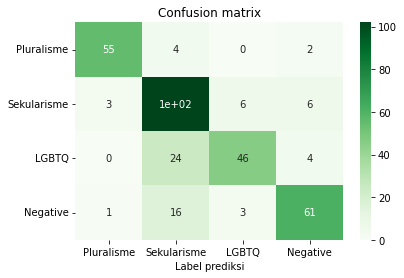

In [32]:
ax = sn.heatmap(df_cm, cmap='Greens', annot=True)
ax.set_title('Confusion matrix')
ax.set_xlabel('Label prediksi')

## K-Fold Cross Validation

In [33]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(model, X_train, y_train, cv=10)

print(scores)

[0.79       0.82       0.84       0.79       0.8        0.69
 0.70707071 0.76767677 0.77777778 0.77777778]


In [34]:
print(scores.mean())

0.776030303030303


In [35]:
fig = px.bar(scores, y=scores, color=scores, 
             #labels={"scores":'Cross Validation'}, 
             text_auto='.2s', title="Hasil 10 Cross Validation")

fig.show()

# Uji Coba Model

In [ ]:
coba = input()

coba=[coba]

In [46]:
test_1_unseen =  bow_transformer.transform(coba)
data=test_1_unseen.toarray()
print("diubah menjadi array: \n ",data)

diubah menjadi array: 
  [[0 0 0 ... 0 0 0]]


In [47]:
prediction_unseen = model.predict(data)
print(prediction_unseen)

['Negative']
